## **Factor Modeling in R**
- reference : https://www.r-bloggers.com/2019/11/factor-modeling-in-r/

The most popular models for analysing the risk of portfolios are factor models, since stocks have a tendency to move together. The principal component of securities often explains a large share of it’s variance. Since we are mostly concerned with multiple assets which form a portfolio we need to account for this. Some questions might be why do stocks with low Price to Book ratios outperform stocks with higher Price to Book ratios? Here the “Price” part of the ratio is simply the share price (per share) and the “Book” part of the ratio is the “Shareholders Equity” / “Shares Outstanding” which are items found on a companies Balance Sheet.

Another important reason Factor models are popular are dimensionality. Assume 𝑁
 assets which subsequently has 𝑁
 variances and 𝑁(𝑁−1)/2
 correlations. If we have a factor model with 𝐹
 factors, it has 𝑁
 idiosyncratic variances, 𝐹
 factor variances and 𝑁𝐹
 betas. As long as:

 2𝐹<𝑁(𝑁−1)/(𝑁+1)

We have fewer parameters with factor models.

The Capital Asset Pricing Model Sharpe (1964) is the simplest factor model consisting of a single factor.

𝑟𝑖=𝑎𝑖+𝑏𝑖𝑓+𝑒𝑖

The mean-variance parameters are:

𝑟⎯⎯⎯𝑖=𝑎𝑖+𝑏𝑖𝑦⎯⎯⎯
𝜎2𝑖=𝑏2𝑖𝜎2𝜖𝑖

𝜎𝑖𝑗=𝑏𝑖𝑏𝑗𝜎2𝑦

The 𝐶𝑜𝑣(𝑟𝑖,𝑦)=𝐶𝑜𝑣(𝑎𝑖+𝑏𝑖𝑦+𝑒𝑖,𝑦)=𝑏𝑖𝜎2𝑦
 and therefore 𝑏𝑖
 is;

𝑏𝑖=𝐶𝑜𝑣(𝑟𝑖,𝑦)𝜎2𝑦

This is alternatively expressed as;

𝑏𝑖=𝐶𝑜𝑣(𝑟𝑖,𝑦)/𝑉𝑎𝑟(𝑦)

Where 𝑏
 is the slope of the regression line which minimises the squared distance of returns and 𝑎
 is the intercept or 𝑎𝑙𝑝ℎ𝑎
 which are expressed on a line 𝑎+𝑏𝑓
.

I will go through these calculations using Base R functions, however first we need some data and for this I like the tidy functions which require a few packages.


I download daily price data from Yahoo Finance using quantmod or tidyquant’s wrapper to the quantmod package. The difference here being that quantmod collects data and stores it as an xts object and tidyquant collects the data and stores it as a tibble, from here we are able to more easily use functions from the tidyverse way of handling data, we convert the data back to an xts object using the tk_xts function from the timetk package.

The firms are Apple, Harley Davidson, Nvidia, Microsoft, AMD, Ford, General Electric, 3M, Intel and Amazon.


In [2]:
install.packages("pacman")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [89]:
pacman::p_load("quantmod","ggplot2","tidyquant","tidyr","dplyr","timetk",
               "tibble","rvest","corrplot","stringr","PerformanceAnalytics","plotly",
               "factoextra","threejs","frenchdata","gtools","purrr","rlist","lmtest","sandwich")


start_date = "2016-01-01"
end_date = "2017-12-31"

symbols = c("AAPL", "HOG", "NVDA", "MSFT", "AMD", "F", "GE", "MMM", "AMZN")

portfolio_prices = tq_get(
  symbols,
  from = start_date,
  to = end_date
) %>%
  select(symbol, date, adjusted) %>%
  pivot_wider(names_from = symbol, values_from = adjusted) %>%
  tk_xts(date_var = date)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


sandwich installed

Warning message:
“Non-numeric columns being dropped: date”


The data looks like the following, I removed the Open, High, Low, Close and Volume data and kept just the Adjusted prices, where each asset is it’s own column, the data has been converted into a time series object or an xts object where the date is stored as the index (or rownames) and is not visable in the table below.

In [4]:
portfolio_prices

               AAPL      HOG      NVDA     MSFT   AMD        F        GE
2016-01-04 23.97748 37.47097  7.900973 48.69889  2.77 9.276602 165.06953
2016-01-05 23.37661 37.28165  8.027897 48.92104  2.75 9.110595 165.23073
2016-01-06 22.91914 35.72584  7.695942 48.03239  2.51 8.705527 162.59697
2016-01-07 21.95185 35.50358  7.390837 46.36168  2.28 8.433271 155.71678
2016-01-08 22.06793 36.01394  7.232183 46.50388  2.14 8.327029 152.92174
2016-01-11 22.42526 35.31425  7.244388 46.47722  2.34 8.479756 153.62048
2016-01-12 22.75072 34.86150  7.366428 46.90377  2.39 8.532882 153.94302
2016-01-13 22.16579 34.40876  7.141873 45.89070  2.25 8.101255 151.79300
2016-01-14 22.65057 34.54870  6.997864 47.19704  2.21 8.094615 156.20055
2016-01-15 22.10662 33.28923  6.617094 45.31307  2.03 7.948526 153.13676
       ...                                                              
2017-12-15 41.12712 44.01095 47.389957 81.06910 10.29 9.436580 101.41078
2017-12-18 41.70631 45.04886 48.958401 80.63039 10.

I also collect the S&P500 data using the same method:

In [5]:
SPY = tq_get(
  "^GSPC",
  from = start_date,
  to = end_date
) %>%
  select(date, adjusted) %>%
  tk_xts(date_var = date)


Warning message:
“Non-numeric columns being dropped: date”


In [6]:
SPY

           adjusted
2016-01-04  2012.66
2016-01-05  2016.71
2016-01-06  1990.26
2016-01-07  1943.09
2016-01-08  1922.03
2016-01-11  1923.67
2016-01-12  1938.68
2016-01-13  1890.28
2016-01-14  1921.84
2016-01-15  1880.33
       ...         
2017-12-15  2675.81
2017-12-18  2690.16
2017-12-19  2681.47
2017-12-20  2679.25
2017-12-21  2684.57
2017-12-22  2683.34
2017-12-26  2680.50
2017-12-27  2682.62
2017-12-28  2687.54
2017-12-29  2673.61

We can plot the data using the chartSeries function.

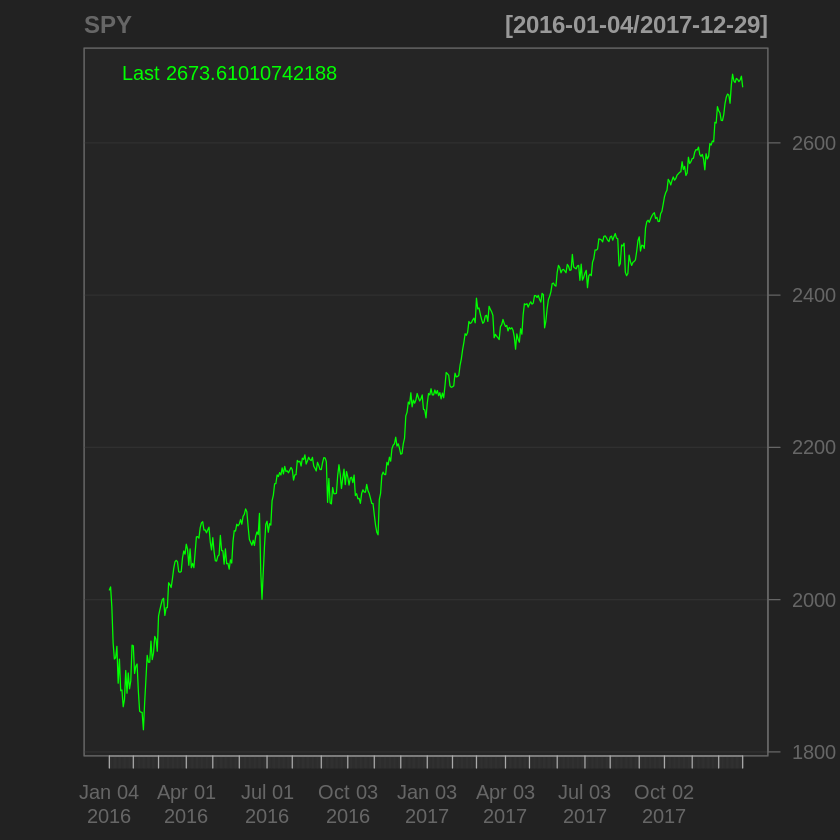

In [7]:
chartSeries(SPY)

 compute the daily log returns for all the assets in the portfolio_returns and the SPY returns

In [8]:
portfolio_returns = diff(log(portfolio_prices), na.pad = FALSE)
SPY_returns = diff(log(SPY), na.pad = FALSE)

The returns data for each asset looks like:


In [9]:
SPY_returns

                adjusted
2016-01-05  0.0020102041
2016-01-06 -0.0132021630
2016-01-07 -0.0239858165
2016-01-08 -0.0108975374
2016-01-11  0.0008529083
2016-01-12  0.0077725141
2016-01-13 -0.0252823751
2016-01-14  0.0165580609
2016-01-15 -0.0218357727
2016-01-19  0.0005316802
       ...              
2017-12-15  0.0089343134
2017-12-18  0.0053484786
2017-12-19 -0.0032354980
2017-12-20 -0.0008282361
2017-12-21  0.0019836870
2017-12-22 -0.0004582716
2017-12-26 -0.0010589757
2017-12-27  0.0007906283
2017-12-28  0.0018323190
2017-12-29 -0.0051966323

We can use the autoplot to plot xts or time series data with ggplot functionality, (I only plot the first 3 assets):

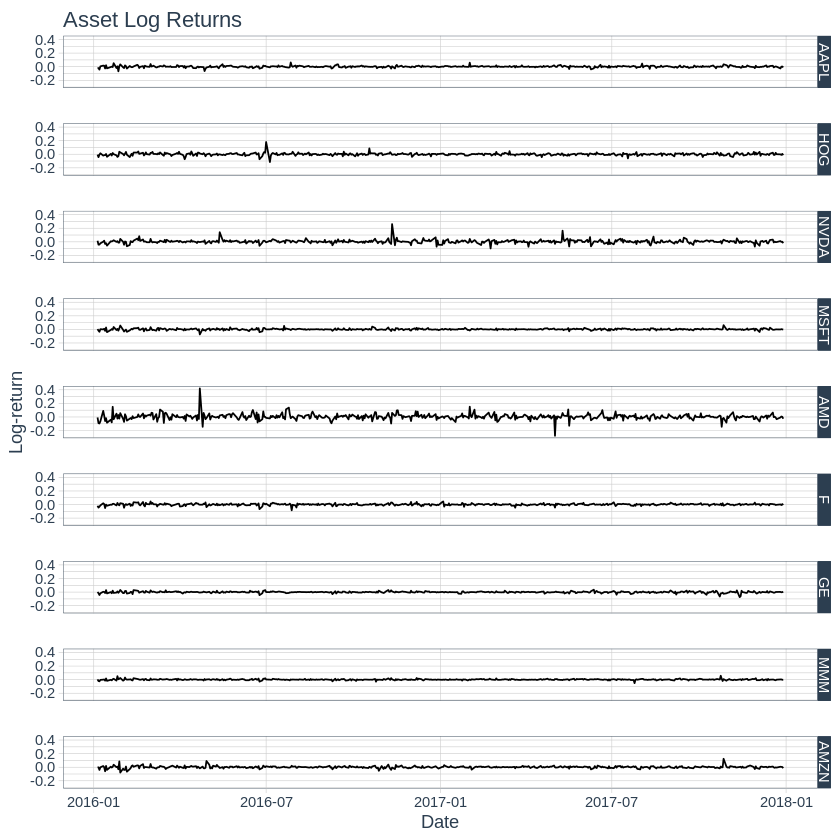

In [10]:
autoplot(portfolio_returns) +
  xlab("Date") +
  ylab("Log-return") +
  ggtitle("Asset Log Returns") +
  theme_tq()


### **Technical R:**
##### **From here I will talk a little more technically but will keep it as simple as possible.**

Next I compute the calculations described at the begining of the post. We first need to define a few things:

- The number of assets we have in the portfolio, denoted previously as 𝑁
- The number of days we apply our model which is usually denoted as 𝑇

In [11]:
N_portfolio = length(symbols)
days = nrow(portfolio_prices)


,adjusted
AAPL,1.0957889
HOG,1.2029245
NVDA,1.4938338
MSFT,1.2472164
AMD,2.1738305
F,1.2570530
GE,0.9677282
MMM,0.7626618
AMZN,1.1260596


#### **(a) We can compute 𝛽 as the following:**

In [12]:
beta = cov(portfolio_returns, SPY_returns) / as.numeric(var(SPY_returns))
beta

,adjusted
AAPL,1.0957889
HOG,1.2029245
NVDA,1.4938338
MSFT,1.2472164
AMD,2.1738305
F,1.2570530
GE,0.9677282
MMM,0.7626618
AMZN,1.1260596


However, in order to understand it better we can break it down each of the computations:

The 𝑐𝑜𝑣
 covariance matrix part of the 𝑏𝑒𝑡𝑎
 formula looks like:

In [13]:
cov(portfolio_returns, SPY_returns)

,adjusted
AAPL,4.663338e-05
HOG,5.119274e-05
NVDA,6.357294e-05
MSFT,5.307767e-05
AMD,9.251150e-05
F,5.349629e-05
GE,4.118352e-05
MMM,3.245653e-05
AMZN,4.792161e-05


We can compute the covariances using base R as follows:

𝐶𝑜𝑣(𝑥,𝑦)=∑𝑖=1𝑁((𝑥𝑖−𝑥⎯⎯⎯)(𝑦𝑖−𝑦⎯⎯⎯))(𝑛−1)

Where 𝑥𝑖
 is our asset and 𝑦𝑖
 is the SPY500. In R we can compute this as:

In [14]:
x = portfolio_returns[,1] # which takes the first Asset in the portfolio_returns data
x_bar = colMeans(x)
y = SPY_returns[,1]
y_bar = colMeans(y)
n = length(x)
sum(((x - x_bar)*(y - y_bar))) / (n-1)

[1] 4.663338e-05

Which corresponds to the first result, AAPL in the cov(portfolio_returns, SPY_returns) calculation. We can change the 1
 in x = portfolio_returns[,1] to 2
, 3
, 4
 … 𝑁
 to compute the covariances for each of the assets (HOG, NVDA and MSFT, respectively), or we can wrap the above into a for loop to compute for all assets. Note: I only changed the 1
 to an 𝑖
 from the above equation in the for loop, everything else is constant.

In [15]:
for(i in 1:ncol(portfolio_returns)){
  x = portfolio_returns[,i]
  x_bar = colMeans(x)
  y = SPY_returns[,1]
  y_bar = colMeans(y)
  cov_x_y = sum(((x - x_bar)*(y - y_bar))) / (n-1)
  print(cov_x_y)
}


[1] 4.663338e-05
[1] 5.119274e-05
[1] 6.357294e-05
[1] 5.307767e-05
[1] 9.25115e-05
[1] 5.349629e-05
[1] 4.118352e-05
[1] 3.245653e-05
[1] 4.792161e-05


The variance of the SPY returns is.

In [16]:
var(SPY_returns)

,adjusted
adjusted,4.25569e-05


Which is calculated as:

𝑉𝑎𝑟=∑(((𝑦−𝑦⎯⎯⎯)2)(𝑛−1))

In base R we can simply calculate it as:

In [17]:
n = length(SPY_returns)
y = SPY_returns[,1]
y_bar = colMeans(y)

sum(((y - y_bar)**2) / (n-1))

[1] 4.25569e-05

Putting all this together, we can compute 𝑏𝑒𝑡𝑎
. Recall, that 𝛽=𝐶𝑜𝑣(𝑟𝑖,𝑦)𝑉𝑎𝑟(𝑦)
 where here 𝑟𝑖
 is each of our assets in our portfolio and 𝑦
 is the market returns or SPY500 returns.

To compute 𝑏𝑒𝑡𝑎
 for each of our assets using base R we can wrap the above code into a function:



In [18]:
myBetaComputation = function(ASSET){
  x = ASSET                   # which Asset in the portfolio_returns data we want to compute beta for.
  x_bar = colMeans(x)

  y = SPY_returns[,1]
  y_bar = colMeans(y)

  cov_x_y = sum(((x - x_bar)*(y - y_bar))) / (n-1)


  n = length(SPY_returns)
  y = SPY_returns[,1]
  y_bar = colMeans(y)

  var_y = sum(((y - y_bar)**2) / (n-1))

  return(cov_x_y / var_y)
}

In [19]:
myBetaComputation(portfolio_returns[,1])
myBetaComputation(portfolio_returns[,2])

sapply(portfolio_returns, myBetaComputation)


[1] 1.095789

[1] 1.202925

AAPL       HOG      NVDA      MSFT       AMD         F        GE       MMM 
1.0957889 1.2029245 1.4938338 1.2472164 2.1738305 1.2570530 0.9677282 0.7626618 
     AMZN 
1.1260596

The interpretation here is that a value of 1 indicates that the asset moves in perfect correlation with the market, values >
 1 indicate that an asset moves more than when the market moves or moves with more volatility when the market moves and values <
 1 indicates that an asset moves less than the market.

Typically Tech stocks have a higher market 𝛽
 whereas mature non-tech stocks have a lower market 𝛽
. That is, AAPL, NVDA, MSFT and AMD all have betas above 1 whereas HOG and Ford (F) have 𝛽
’s less than 1.

#### **(b) We can compute 𝛼  as the following:**  

Now that we have 𝛽
 we can estimate 𝛼
 for each of our assets in our portfolio.

Recall, that alpha is defined as;

𝛼=𝑟𝑖⎯⎯⎯⎯−𝛽𝑖∗𝑓⎯⎯⎯⎯

Where 𝑟𝑖⎯⎯⎯⎯
 is the average returns of our individual assets in our portfolio, 𝛽𝑖
 is the beta of each asset over our sample period and 𝑓⎯⎯⎯⎯
 is the average returns of SPY. Therefore, we can compute 𝛼
 as;

In [20]:
alpha = colMeans(portfolio_returns) - beta*colMeans(SPY_returns)


The alpha or 𝛼
 for our assests, looks like:

In [21]:
alpha

,adjusted
AAPL,0.0003999105
HOG,-0.0003434988
NVDA,0.0027436127
MSFT,0.0002794269
AMD,0.0013825598
F,-0.0006913345
GE,-0.0015460088
MMM,0.0006076258
AMZN,0.0005732711


There are other ways to calculate 𝛽
 and 𝛼
 but for a single factor model we can use the CAPM.beta and CAPM.alpha from the PerformanceAnalytics package.

In [22]:
CAPM.beta(Ra = portfolio_returns, Rb = SPY_returns, Rf = 0)
CAPM.alpha(Ra = portfolio_returns, Rb = SPY_returns,Rf = 0)


,AAPL,HOG,NVDA,MSFT,AMD,F,GE,MMM,AMZN
Beta: adjusted,1.095789,1.202925,1.493834,1.247216,2.17383,1.257053,0.9677282,0.7626618,1.12606


,AAPL,HOG,NVDA,MSFT,AMD,F,GE,MMM,AMZN
Alpha: adjusted,0.0003999105,-0.0003434988,0.002743613,0.0002794269,0.00138256,-0.0006913345,-0.001546009,0.0006076258,0.0005732711


Which is much simpler than what we just did. The Ra is the asset returns, Rb is the market returns and Rf is the risk-free rate of return.

Upon investigating the CAPM.beta functions from the PerformanceAnalytics package I noticed they had functions for CAPM.beta.bull and CAPM.beta.bear, so I wanted to see how these would look like plotted for each asset.

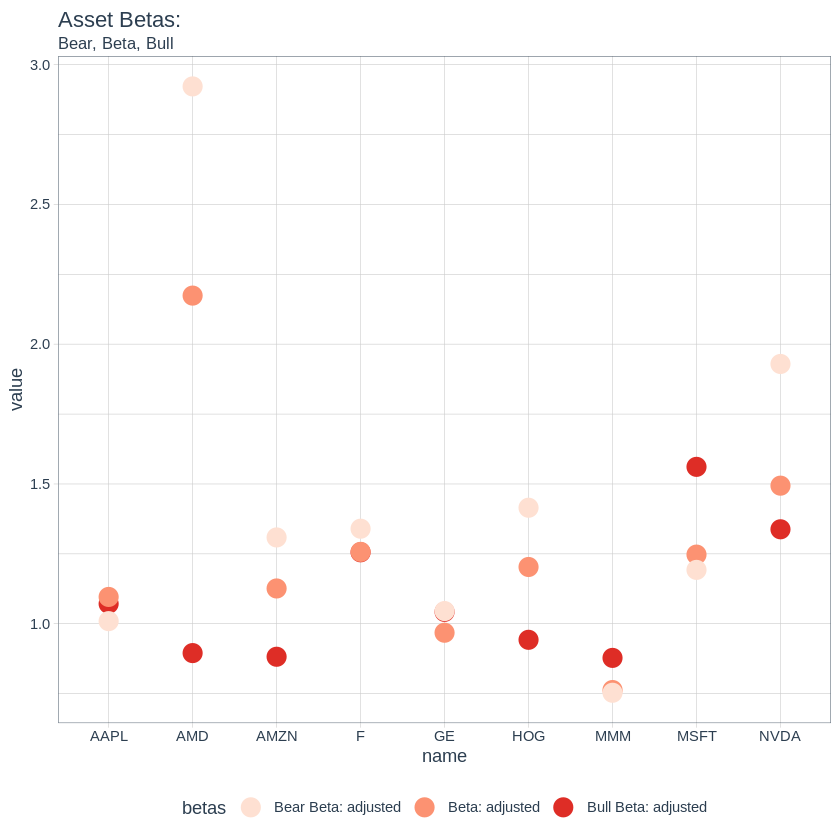

In [23]:
rbind(
  CAPM.beta.bull(Ra = portfolio_returns, Rb = SPY_returns, Rf = 0),
  CAPM.beta(Ra = portfolio_returns, Rb = SPY_returns, Rf = 0),
  CAPM.beta.bear(Ra = portfolio_returns, Rb = SPY_returns, Rf = 0)
) %>%
  as_tibble(rownames = NA) %>%
  rownames_to_column("betas") %>%
  pivot_longer(2:ncol(.)) %>%
  ggplot(aes(x = name, y = value, color = betas)) +
  geom_point(size = 5, shape = 19) +
  scale_color_brewer(type='seq', palette='Reds') +
  theme_tq() +
  ggtitle("Asset Betas:", subtitle = "Bear, Beta, Bull")

#### **Visualising the covariance matrix of the returns**

In order to visualise the the covariance matrix some further formulas are needed.

Ultimately we want to compute the following;

Σ̂ =𝑣𝑎𝑟(𝑦)𝛽̂ 𝛽̂ 𝑇+𝜓̂
Where;
𝜓̂ =𝑑𝑖𝑎𝑔(𝜎̂ 21,...𝜎̂ 2𝑖,...𝜎̂ 2𝑁)

We use our 𝛽
 and 𝛼
 results from before as well as 𝑁
. I created a function which takes in the 𝑎𝑠𝑠𝑒𝑡
 and computes the residules and Sigma values. What we are calculating here is the following;

err
𝜖𝑖^=𝑥𝑖−𝛼𝑖−𝛽𝑖∗𝑦

Where 𝑖=1.,...,𝑁

Sigma
𝜎̂ 2𝑖=1𝑁−2𝜖̂ 𝑁𝑖𝜖𝑖

The code in base R for the above equations is:

In [24]:
beta = cov(portfolio_returns, SPY_returns) / as.numeric(var(SPY_returns))
alpha = colMeans(portfolio_returns) - beta*colMeans(SPY_returns)
N = length(SPY_returns)

mySigmaFunction <- function(ASSET){
  err = portfolio_returns[, ASSET] - alpha[ASSET ,] - beta[ASSET ,] * SPY_returns
  Sigma = (1 / (N - 2)) %*% t(err) %*% err
  return(Sigma)
}

In [25]:
mySigmaFunction("AAPL")

AAPL
0.0001188875


In [26]:
mySigmaFunction("F")

F
0.0001324533


In [27]:
sapply(colnames(portfolio_returns), mySigmaFunction)

AAPL          HOG         NVDA         MSFT          AMD            F 
1.188875e-04 2.937560e-04 6.147786e-04 7.930606e-05 1.741310e-03 1.324533e-04 
          GE          MMM         AMZN 
9.985929e-05 4.878153e-05 1.975903e-04

Now that we have the 𝜎
 values. we want to create a matrix with the Sigma values down the digaonal.

In [29]:
SigmaFunction = function(asset){
  err = portfolio_returns[,asset] - alpha[asset,] - beta[asset,]*SPY_returns
  sigma = (1 / (length(SPY_returns) - 2)) %*% t(err) %*% err
  return(sigma)
}

In [30]:
Sigma2 = sapply(colnames(portfolio_returns), SigmaFunction)
diag_Sigma2 = diag(Sigma2)
colnames(diag_Sigma2) = colnames(portfolio_returns)
rownames(diag_Sigma2) = colnames(portfolio_returns)

Which creates our diagonal matrix as follows:

In [31]:
diag_Sigma2

,AAPL,HOG,NVDA,MSFT,AMD,F,GE,MMM,AMZN
AAPL,0.0001188875,0.000000000,0.0000000000,0.000000e+00,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
HOG,0.0000000000,0.000293756,0.0000000000,0.000000e+00,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
NVDA,0.0000000000,0.000000000,0.0006147786,0.000000e+00,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
MSFT,0.0000000000,0.000000000,0.0000000000,7.930606e-05,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
AMD,0.0000000000,0.000000000,0.0000000000,0.000000e+00,0.00174131,0.0000000000,0.000000e+00,0.000000e+00,0.0000000000
F,0.0000000000,0.000000000,0.0000000000,0.000000e+00,0.00000000,0.0001324533,0.000000e+00,0.000000e+00,0.0000000000
GE,0.0000000000,0.000000000,0.0000000000,0.000000e+00,0.00000000,0.0000000000,9.985929e-05,0.000000e+00,0.0000000000
MMM,0.0000000000,0.000000000,0.0000000000,0.000000e+00,0.00000000,0.0000000000,0.000000e+00,4.878153e-05,0.0000000000
AMZN,0.0000000000,0.000000000,0.0000000000,0.000000e+00,0.00000000,0.0000000000,0.000000e+00,0.000000e+00,0.0001975903


Now that we have our diagonal matrix 𝐷𝑖𝑎𝑔(𝜓)
 we can compute the covariance matrix of the returns using:
Σ=𝑣𝑎𝑟(𝑦)𝛽𝛽𝑇+𝜓

Then use the cov2cor function from the stats package.

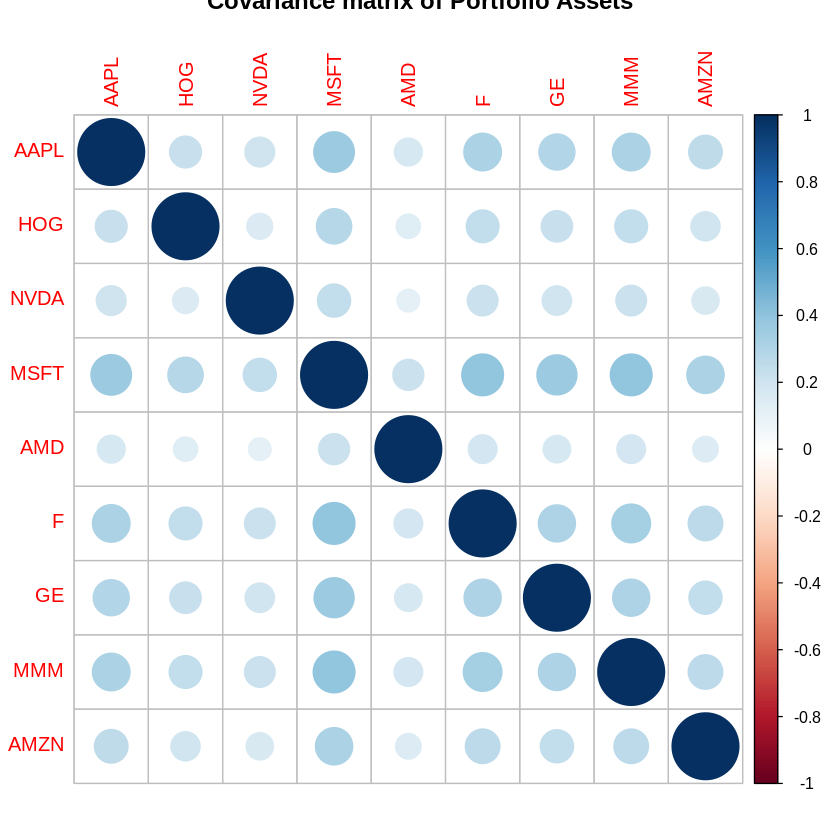

In [32]:
Sigma = as.numeric(var(SPY_returns)) * beta %*% t(beta) + diag_Sigma2
corrplot(cov2cor(Sigma), main = "Covariance matrix of Portfolio Assets")

The correlation table looks like:



In [33]:
cor(Sigma)

,AAPL,HOG,NVDA,MSFT,AMD,F,GE,MMM,AMZN
AAPL,1.00000000,-0.079855362,0.016654568,0.092872336,0.273085144,0.02333595,-0.09534072,-0.09453177,-0.088040643
HOG,-0.07985536,1.000000000,-0.056988603,-0.001837953,0.060337383,-0.04452495,-0.10538041,-0.10284902,-0.103997558
NVDA,0.01665457,-0.056988603,1.000000000,0.113637463,0.003107861,0.03609056,0.01106769,0.09401804,-0.038795534
MSFT,0.09287234,-0.001837953,0.113637463,1.000000000,0.456919507,0.18044750,0.03610168,0.10792927,0.003279959
AMD,0.27308514,0.060337383,0.003107861,0.456919507,1.000000000,0.27448214,0.30124068,0.58345525,0.127406030
F,0.02333595,-0.044524949,0.036090564,0.180447499,0.274482138,1.00000000,-0.01799688,0.03125740,-0.040821707
GE,-0.09534072,-0.105380405,0.011067692,0.036101684,0.301240676,-0.01799688,1.00000000,-0.19384809,-0.123775506
MMM,-0.09453177,-0.102849021,0.094018043,0.107929271,0.583455252,0.03125740,-0.19384809,1.00000000,-0.135671787
AMZN,-0.08804064,-0.103997558,-0.038795534,0.003279959,0.127406030,-0.04082171,-0.12377551,-0.13567179,1.000000000


### **ETF analysis and a randomly sampled portfolio**

#### **Analysing my randomly selected portfolio and a series of U.S. funds**

Since factor modelling is all about risk and portfolio analysis I thought it would be interesting to compare the performance of a number of U.S. Exchnage Traded Funds (ETFs) and a randomly selected portfolio of assets from the SP500.

In order to construct the randomly created portfolio I first scraped the wikipedia page which contains the list of SP500 firms along with their ticker symbol, I filter out all Class A, B and C shares since a few firms have multiple asset classes and I don’t want to sample two of the same asset.

Just as before I collect the data and put it into time series format.

In [34]:
start_date = "2016-01-01" ; end_date = "2017-12-31"

url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"
symbols = url %>%
  read_html() %>%
  html_nodes(xpath = '//*[@id="constituents"]') %>%
  html_table() %>%
  .[[1]] %>%
  filter(!str_detect(Security, "Class A|Class B|Class C")) %>%     # Removes firms with Class A shares
  sample_n(20) %>%
  pull(Symbol)

asset_prices = tq_get(
  symbols,
  from = start_date,
  to = end_date
) %>%
  select(symbol, date, adjusted) %>%
  pivot_wider(names_from = symbol, values_from = adjusted) %>%
  tk_xts(date_var = date)


Warning message:
“Non-numeric columns being dropped: date”


Which looks like:

In [35]:
asset_prices

              BIO       LHX      DRI     ODFL       GL      ATO      HAS
2016-01-04 136.19  75.15996 50.23983 37.94758 52.83199 52.01134 52.27534
2016-01-05 136.18  75.60588 51.15255 38.27886 53.47925 52.20313 53.22779
2016-01-06 134.81  74.91988 50.77329 37.36297 52.44737 52.36992 54.56278
2016-01-07 131.99  73.95090 50.41824 35.92744 51.56559 51.86122 53.96165
2016-01-08 130.51  73.60788 50.03897 35.66112 51.04966 51.91961 53.11849
2016-01-11 130.49  74.55116 49.99861 35.40128 51.06842 52.09473 54.65646
2016-01-12 130.45  76.24044 50.44243 35.95992 51.24664 51.77785 55.29663
2016-01-13 126.00  73.23063 49.91793 34.42045 50.20539 51.48596 53.46200
2016-01-14 127.17  72.45028 49.76461 34.35549 50.57123 52.52003 54.80479
2016-01-15 124.63  72.24449 48.60259 33.77738 49.67070 52.51168 56.26469
       ...                                                              
2017-12-15 251.94 128.82462 75.40479 84.40631 85.31731 78.01652 77.04668
2017-12-18 249.24 127.55511 77.22149 84.32804 85.56

Next, I collect the U.S. ETFs. I scraped a website (which I cannot remember the name) for the symbols of the ETFs.

In [36]:
myETFs = c("SPY", "IVV", "VTI", "VOO", "QQQ", "VEA", "IEFA", "AGG", "VWO",
           "EFA","IEMG","VTV", "IJH", "IWF","BND", "IJR", "IWM", "VUG",
           "GLD", "IWD", "VIG", "VNQ", "USMV", "LQD", "VO", "VYM", "EEM",
           "VB", "VCSH", "XLF", "VCIT", "VEU", "XLK", "ITOT", "IVW", "BNDX",
           "VGT", "DIA", "BSV", "SHV", "IWB", "IWR", "TIP", "SCHF", "MBB", "SDY",
           "MDY", "SCHX", "IEF", "HYG", "DVY", "XLV", "SHY", "IXUS", "TLT", "IVE",
           "PFF", "IAU", "VXUS", "RSP", "SCHB", "VV", "GOVT", "EMB", "MUB", "QUAL",
           "XLY", "VBR", "EWJ", "XLP", "VGK", "SPLV", "MINT", "BIV", "IGSB", "EFAV",
           "VT", "GDX", "XLU", "IWS", "XLI", "SCHD", "IWP", "ACWI", "VMBS", "XLE", "JNK",
           "VOE", "FLOT", "IWV", "JPST", "SCZ", "IEI", "IWN", "DGRO", "VBK", "IGIB", "IWO")


etf_prices = tq_get(
  myETFs,
  from = start_date,
  to = end_date
) %>%
  select(symbol, date, adjusted) %>%
  pivot_wider(names_from = symbol, values_from = adjusted) %>%
  tk_xts(date_var = date)

Warning message:
“Non-numeric columns being dropped: date”


The data looks like:

In [37]:
etf_prices

                SPY      IVV       VTI      VOO       QQQ      VEA     IEFA
2016-01-04 175.2918 176.2560  89.78107 160.2124 103.23032 28.81178 43.00214
2016-01-05 175.5883 176.6225  89.98206 160.4992 103.05119 28.77991 42.92991
2016-01-06 173.3734 174.3102  88.77612 158.4651 102.06133 28.25418 42.17548
2016-01-07 169.2139 170.1394  86.60018 154.6056  98.86542 27.72048 41.37290
2016-01-08 167.3565 168.2547  85.61272 152.9628  98.05468 27.37795 40.84320
2016-01-11 167.5221 168.4292  85.56029 152.9802  98.35633 27.49744 40.98767
2016-01-12 168.8738 169.7293  86.14576 154.2493  99.49704 27.60896 41.18029
2016-01-13 164.6620 165.6021  83.92615 150.4767  96.06546 27.19474 40.50613
2016-01-14 167.3652 168.2284  85.21075 152.9193  98.11121 27.51337 41.01175
2016-01-15 163.7725 164.6859  83.41932 149.6422  95.06615 26.55749 39.55909
       ...                                                                 
2017-12-15 242.0056 242.4716 124.30305 221.6274 151.33220 37.23373 55.14208
2017-12-18 2

I also collect the SPY500.

In [38]:
SPY_prices = tq_get(
  "^GSPC",
  from = start_date,
  to = end_date
) %>%
  select(date, adjusted) %>%
  tk_xts(date_var = date)


Warning message:
“Non-numeric columns being dropped: date”


Which looks like:

In [39]:
SPY_prices

           adjusted
2016-01-04  2012.66
2016-01-05  2016.71
2016-01-06  1990.26
2016-01-07  1943.09
2016-01-08  1922.03
2016-01-11  1923.67
2016-01-12  1938.68
2016-01-13  1890.28
2016-01-14  1921.84
2016-01-15  1880.33
       ...         
2017-12-15  2675.81
2017-12-18  2690.16
2017-12-19  2681.47
2017-12-20  2679.25
2017-12-21  2684.57
2017-12-22  2683.34
2017-12-26  2680.50
2017-12-27  2682.62
2017-12-28  2687.54
2017-12-29  2673.61

Now, we have a series of 3 data sets, the daily prices of the adjusted close for the randomly selected assets from the SPY500 wikipedia page, the ETFs and the SPY500. Next I calculate the daily returns.

In [40]:
asset_returns = diff(log(asset_prices), na.pad = FALSE)
etf_returns = diff(log(etf_prices), na.pad = FALSE)
SPY_returns = diff(log(SPY_prices), na.pad = FALSE)


The asset_returns looks like:

In [41]:
asset_returns

                     BIO           LHX           DRI          ODFL
2016-01-05 -7.350124e-05  5.915453e-03  0.0180040503  0.0086921455
2016-01-06 -1.011112e-02 -9.114844e-03 -0.0074418611 -0.0242176703
2016-01-07 -2.114016e-02 -1.301790e-02 -0.0070174732 -0.0391786944
2016-01-08 -1.127639e-02 -4.649242e-03 -0.0075507336 -0.0074404150
2016-01-11 -1.531725e-04  1.273345e-02 -0.0008069630 -0.0073129882
2016-01-12 -3.066494e-04  2.240650e-02  0.0088374996  0.0156567805
2016-01-13 -3.470808e-02 -4.027827e-02 -0.0104524647 -0.0437539243
2016-01-14  9.242853e-03 -1.071324e-02 -0.0030762509 -0.0018890471
2016-01-15 -2.017543e-02 -2.844440e-03 -0.0236271456 -0.0169705880
2016-01-19  5.680690e-03  1.067310e-03  0.0099126577 -0.0207914478
       ...                                                        
2017-12-15  8.850679e-03  1.976510e-02  0.0165366189  0.0102509427
2017-12-18 -1.077466e-02 -9.903366e-03  0.0238070360 -0.0009277300
2017-12-19 -8.380395e-03 -7.010691e-04  0.0657181626  0.003628

However, I want to assume that I own all of these assets in a single portfolio. So I average over the rows and join the data to the ETFs and call it all_returns.

In [42]:
portfolio_returns = xts(rowMeans(asset_returns), index(asset_returns))
colnames(portfolio_returns) = c("myPortfolio")
all_returns = cbind(portfolio_returns, etf_returns)

The all_returns data looks like the following, where we can now see myPortfolio has been joined with the ETF dataset.

In [43]:
all_returns

             myPortfolio           SPY           IVV           VTI
2016-01-05  0.0039519280  0.0016902606  0.0020772078  2.236152e-03
2016-01-06 -0.0138684509 -0.0126946037 -0.0131782256 -1.349271e-02
2016-01-07 -0.0219869697 -0.0242838800 -0.0242183209 -2.481573e-02
2016-01-08 -0.0085175508 -0.0110374583 -0.0111393160 -1.146808e-02
2016-01-11 -0.0005308540  0.0009894014  0.0010368497 -6.125873e-04
2016-01-12  0.0054890820  0.0080360432  0.0076893883  6.819496e-03
2016-01-13 -0.0288870733 -0.0252568495 -0.0246171460 -2.610353e-02
2016-01-14  0.0115014149  0.0162832824  0.0157349114  1.519035e-02
2016-01-15 -0.0254282522 -0.0216996900 -0.0212826183 -2.124763e-02
2016-01-19 -0.0012154594  0.0013302437  0.0005298398 -1.048113e-03
       ...                                                        
2017-12-15  0.0074188678  0.0082930788  0.0084121765  8.909089e-03
2017-12-18  0.0028491773  0.0063210581  0.0062077003  6.882565e-03
2017-12-19 -0.0010309641 -0.0038477759 -0.0039568302 -4.051127

Next, I compute (just as before) the 𝛽
 and 𝛼
 of the portfolios. This time using just the CAPM.beta and CAPM.alpha functions in the PerformanceAnalytics package.

In [44]:
betas = CAPM.beta(Ra = all_returns, Rb = SPY_returns, Rf = 0)
alphas = CAPM.alpha(Ra = all_returns, Rb = SPY_returns, Rf = 0)
beta_alphas = cbind(t(betas), t(alphas))
colnames(beta_alphas) = c("beta", "alpha")


I rank the ETF’s by their 𝛼
 value. We can see the GDX has the highest 𝛼
 and a negative 𝛽
 which makes sense since its a Goldminers ETF whihc tracks the Arca Gold Miners Index (GDMNTR) which tracks the performance of companies involved in the gold mining industry. As far as I know there are very few Gold mining companies listed in the SPY500. However, this is a nice way to present and rank ETFs by their 𝛼
 values and see their corresponding 𝛽
 values.


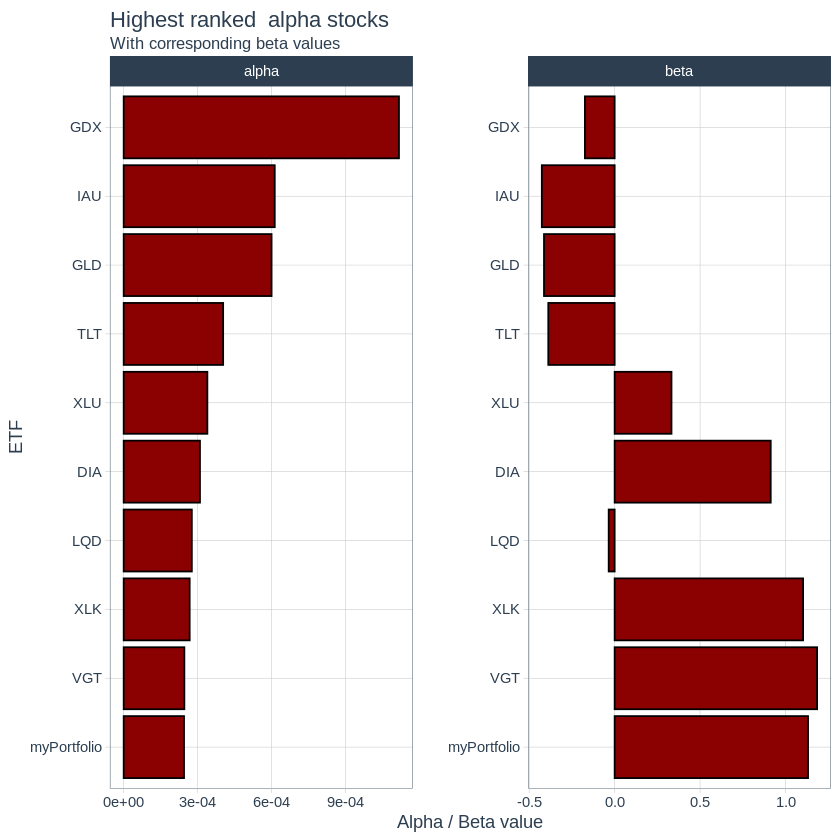

In [45]:
beta_alphas %>%
  as_tibble(rownames = NA) %>%
  rownames_to_column("ETFs") %>%
  arrange(desc(alpha)) %>%
  head(10) %>% # I only take the top 10 observations since there are many ETF's in the data
  pivot_longer(cols = c("beta", "alpha")) %>%
  ggplot(aes(x = reorder(ETFs, if_else(name == "alpha", value, -Inf), FUN = max), y = value)) +
  geom_bar(color = "black", fill = "darkred", stat = "identity") +
  scale_color_brewer(type='seq', palette='Reds') +
  facet_wrap(~name, scales = "free") +
  theme_tq() +
  coord_flip() +
  ggtitle("Highest ranked  alpha stocks", subtitle = "With corresponding beta values") +
  ylab("Alpha / Beta value") +
  xlab("ETF")

We can also rank the 𝑎𝑙𝑝ℎ𝑎
 and 𝑏𝑒𝑡𝑎
 values by taking their ratio of 𝛼/𝛽
 and plot the results.

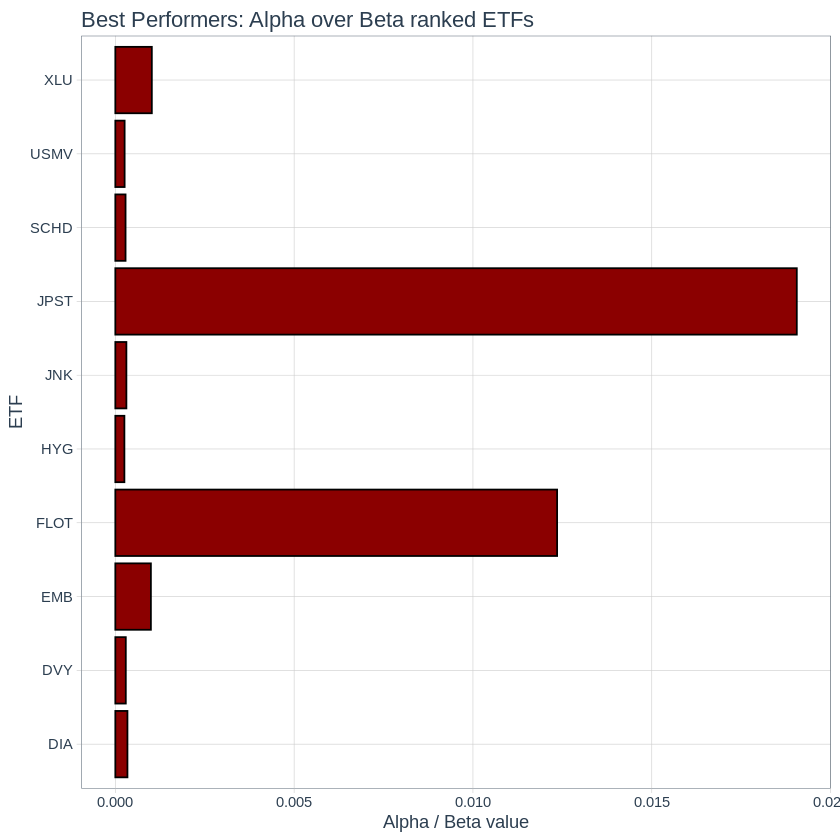

In [46]:
beta_alphas %>%
  as_tibble(rownames = NA) %>%
  rownames_to_column("ETFs") %>%
  mutate(alpha_divided_beta = alpha/beta) %>%
  arrange(desc(alpha_divided_beta )) %>%
  head(10) %>%
  ggplot(aes(x = ETFs, y = alpha_divided_beta )) +
  geom_bar(color = "black", fill = "darkred", stat = "identity") +
  scale_color_brewer(type='seq', palette='Reds') +
  theme_tq() +
  coord_flip() +
  ggtitle("Best Performers: Alpha over Beta ranked ETFs") +
  ylab("Alpha / Beta value") +
  xlab("ETF")


Changing a few lines of code and we can plot and see the worst performers with negative 𝛼
 to 𝛽
 ratios.

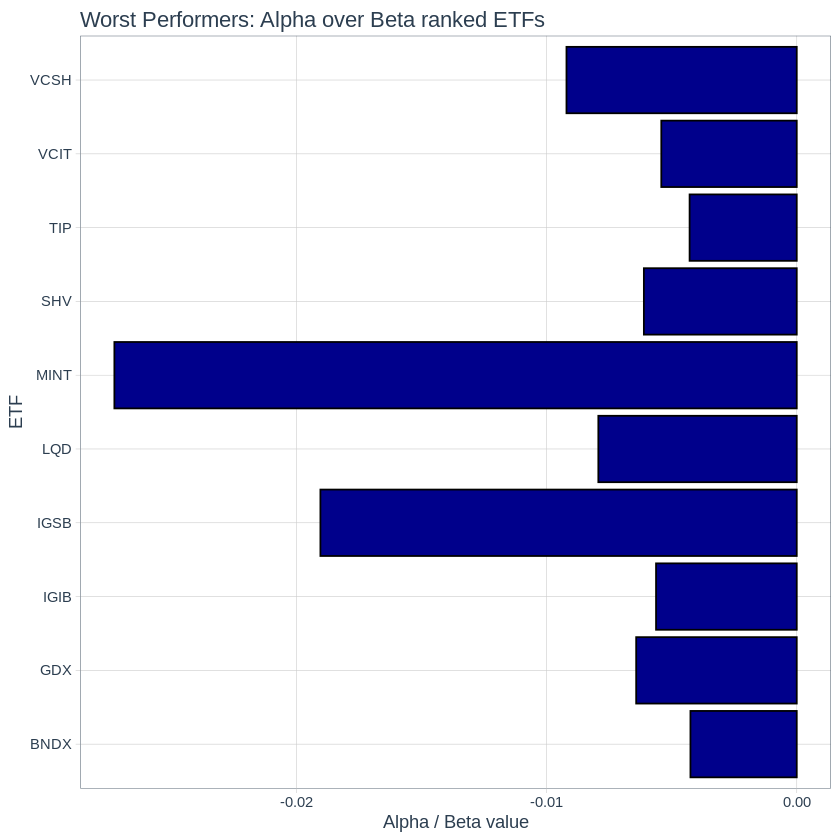

In [47]:
beta_alphas %>%
  as_tibble(rownames = NA) %>%
  rownames_to_column("ETFs") %>%
  mutate(alpha_divided_beta = alpha/beta) %>%
  arrange(alpha_divided_beta) %>%
  head(10) %>%
  ggplot(aes(x = ETFs, y = alpha_divided_beta )) +
  geom_bar(color = "black", fill = "darkblue", stat = "identity") +
  scale_color_brewer(type='seq', palette='Reds') +
  theme_tq() +
  coord_flip() +
  ggtitle("Worst Performers: Alpha over Beta ranked ETFs") +
  ylab("Alpha / Beta value") +
  xlab("ETF")

We can draw bar plot of alpha to beta

In [49]:
al_be_df = beta_alphas %>%
  as.data.frame() %>%
  mutate(alpha_beta = alpha/beta)  %>%
  arrange(desc(alpha_beta))

al_be_df %>%
  arrange(desc(alpha_beta)) %>%
  plot_ly(
    x= ~rownames(al_be_df),
    y= ~alpha_beta,
    type = "bar"
  ) %>%
  layout(title = "Alpha/Beta of Assets",
         xaxis = list(title = "ETFs"),
         yaxis = list(title = "Alpha/Beta Value"))

HTML widgets cannot be represented in plain text (need html)

We can take our ETF 𝛽
 and 𝛼
 values before and compute 𝜎
.

In [53]:
beta = cov(all_returns, SPY_returns) / as.numeric(var(SPY_returns))
alpha = colMeans(all_returns) - beta*colMeans(SPY_returns)
N = length(SPY_returns)

mySigmaFunction <- function(ASSET){
  err = all_returns[, ASSET] - alpha[ASSET ,] - beta[ASSET ,] * SPY_returns
  Sigma = (1 / (N - 2)) %*% t(err) %*% err
  return(Sigma)
}

Sigma2 = sapply(colnames(all_returns), mySigmaFunction)
diag_Sigma2 = diag(Sigma2)
colnames(diag_Sigma2) = colnames(all_returns)
rownames(diag_Sigma2) = colnames(all_returns)

Sigma = as.numeric(var(SPY_returns)) * beta %*% t(beta) + diag_Sigma2

In [65]:
Sigma

,myPortfolio,SPY,IVV,VTI,VOO,QQQ,VEA,IEFA,AGG,VWO,⋯,FLOT,IWV,JPST,SCZ,IEI,IWN,DGRO,VBK,IGIB,IWO
myPortfolio,6.375948e-05,4.812795e-05,4.789119e-05,4.953492e-05,4.806945e-05,5.526568e-05,5.347427e-05,5.376773e-05,-2.573648e-06,6.081174e-05,⋯,2.376343e-07,4.982314e-05,NA,4.759206e-05,-4.467737e-06,5.880867e-05,4.377219e-05,5.943099e-05,-1.287645e-06,6.400333e-05
SPY,4.812795e-05,4.260764e-05,4.226929e-05,4.372007e-05,4.242663e-05,4.877809e-05,4.719697e-05,4.745598e-05,-2.271530e-06,5.367311e-05,⋯,2.097387e-07,4.397445e-05,NA,4.200528e-05,-3.943274e-06,5.190518e-05,3.863381e-05,5.245444e-05,-1.136489e-06,5.649004e-05
IVV,4.789119e-05,4.226929e-05,4.225919e-05,4.350499e-05,4.221791e-05,4.853813e-05,4.696479e-05,4.722253e-05,-2.260356e-06,5.340906e-05,⋯,2.087069e-07,4.375812e-05,NA,4.179863e-05,-3.923875e-06,5.164983e-05,3.844375e-05,5.219639e-05,-1.130898e-06,5.621214e-05
VTI,4.953492e-05,4.372007e-05,4.350499e-05,4.547673e-05,4.366693e-05,5.020407e-05,4.857673e-05,4.884331e-05,-2.337936e-06,5.524219e-05,⋯,2.158702e-07,4.526000e-05,NA,4.323326e-05,-4.058552e-06,5.342258e-05,3.976323e-05,5.398789e-05,-1.169714e-06,5.814147e-05
VOO,4.806945e-05,4.242663e-05,4.221791e-05,4.366693e-05,4.250459e-05,4.871881e-05,4.713961e-05,4.739830e-05,-2.268769e-06,5.360787e-05,⋯,2.094837e-07,4.392100e-05,NA,4.195422e-05,-3.938481e-06,5.184209e-05,3.858686e-05,5.239068e-05,-1.135108e-06,5.642138e-05
QQQ,5.526568e-05,4.877809e-05,4.853813e-05,5.020407e-05,4.871881e-05,7.263995e-05,5.419663e-05,5.449405e-05,-2.608415e-06,6.163322e-05,⋯,2.408444e-07,5.049618e-05,NA,4.823497e-05,-4.528090e-06,5.960310e-05,4.436349e-05,6.023382e-05,-1.305039e-06,6.486792e-05
VEA,5.347427e-05,4.719697e-05,4.696479e-05,4.857673e-05,4.713961e-05,5.419663e-05,7.659833e-05,5.272766e-05,-2.523864e-06,5.963541e-05,⋯,2.330376e-07,4.885938e-05,NA,4.667145e-05,-4.381314e-06,5.767109e-05,4.292547e-05,5.828137e-05,-1.262737e-06,6.276526e-05
IEFA,5.376773e-05,4.745598e-05,4.722253e-05,4.884331e-05,4.739830e-05,5.449405e-05,5.272766e-05,7.895910e-05,-2.537715e-06,5.996268e-05,⋯,2.343165e-07,4.912751e-05,NA,4.692758e-05,-4.405358e-06,5.798758e-05,4.316104e-05,5.860121e-05,-1.269667e-06,6.310971e-05
AGG,-2.573648e-06,-2.271530e-06,-2.260356e-06,-2.337936e-06,-2.268769e-06,-2.608415e-06,-2.523864e-06,-2.537715e-06,3.449575e-06,-2.870176e-06,⋯,-1.121580e-08,-2.351539e-06,NA,-2.246238e-06,2.108671e-07,-2.775636e-06,-2.065948e-06,-2.805008e-06,6.077392e-08,-3.020812e-06
VWO,6.081174e-05,5.367311e-05,5.340906e-05,5.524219e-05,5.360787e-05,6.163322e-05,5.963541e-05,5.996268e-05,-2.870176e-06,1.151588e-04,⋯,2.650138e-07,5.556361e-05,NA,5.307548e-05,-4.982496e-06,6.558443e-05,4.881549e-05,6.627844e-05,-1.436003e-06,7.137760e-05


Finally, I take a random sample of the ETF’s (since there are too many to analyse) and plot the correlations between the ETF’s.

In [72]:
Sigma_subsample = sample(colnames(Sigma), size = length(colnames(Sigma)))
Sigma_sampled = Sigma[ncol = Sigma_subsample, nrow = Sigma_subsample, drop = TRUE]

### **Sharpe Ratio, CAPM and Fama-French Factor Analysis**

Using simple plots still doesn’t give us enough information about an ETF, Portfolio or Asset. The Sharpe ratio Sharpe (1966) is a better measure. The Sharpe ratio is a reward-to-variability ratio which allows us to compare the performance of a portfolio compared to a risk-free asset, after adjusting for it’s risk. It takes the differenece between the portfolio’s return and the risk-free return, this is then divided by the standard deviation (which measures the portfolios volatility).

The Sharpe ratio tells us what the additional unit of return we can expect per unit of risk increase. The Sharpe ratio is defined as:

𝑆=𝑑⎯⎯⎯𝜎𝑑

Where
𝑑˜=𝑅˜𝐹−𝑅˜𝐵

The single asset model with just the market factor looks like:

𝑥𝑡=𝛼+𝛽𝑦𝑡+𝜖𝑡

Taking the expected value of 𝑥
 and 𝑦
 at time 𝑡
 we have:

𝐸[𝑥𝑡]=𝛼+𝛽𝐸[𝑦𝑡]
With variance:

𝑣𝑎𝑟[𝑥𝑡]=𝛽2𝑣𝑎𝑟[𝑦𝑡]+𝜎2

Thus, the Sharpe ratio becomes:

𝐸[𝑥𝑡]𝑣𝑎𝑟[𝑥𝑡]‾‾‾‾‾‾‾√

Recall that 𝜎=𝑣𝑎𝑟[𝑥𝑡]‾‾‾‾‾‾‾√
, we just plug in the values for 𝐸[𝑥𝑡]
 and 𝑣𝑎𝑟[𝑥𝑡]
 defined previously and the equation becomes:

𝛼+𝛽𝐸[𝑦𝑡]𝛽2𝑣𝑎𝑟[𝑦𝑡]+𝜎2‾‾‾‾‾‾‾‾‾‾‾‾‾‾√
Which after some algebra we obtain:

𝛼𝛽+𝐸[𝑦𝑡]𝑣𝑎𝑟[𝑦𝑡]+𝜎2𝛽2‾‾‾‾‾‾‾‾‾‾‾‾√

Finally we end up with:

𝛼𝛽+𝐸[𝑦𝑡](𝑣𝑎𝑟[𝑦𝑡])‾‾‾‾‾‾‾‾√
We can represent the Sharpe ratio as 𝑥⎯⎯⎯(√𝐷𝑖𝑎𝑔(𝜎2))
 where 𝑥⎯⎯⎯
 is the average value of 𝑥
 over the historic period from 𝑡=1
 to 𝑇 simply computed as 𝑥⎯⎯⎯=1𝑇∑𝑇𝑡=1𝐷𝑡
. In R we can simply take

#### **Machine Learning and Clustering**

We can cluster our ETF’s based on their 𝛽
, 𝛼
 and 𝑠ℎ𝑎𝑟𝑝𝑒
 values. Why would we want to do this? Perhaps with more variables than the 3 here the model can cluster these firms in a higher dimensional space and thus we can select our ETF’s based on the clusters and use it as a portfolio diversification tool, that is one cluster might contain riskier ETF’s whereas another might contain value stocks or growth stocks. With such few variables here it doesn’t quite work but with more variables we can better classifiy ETFs.

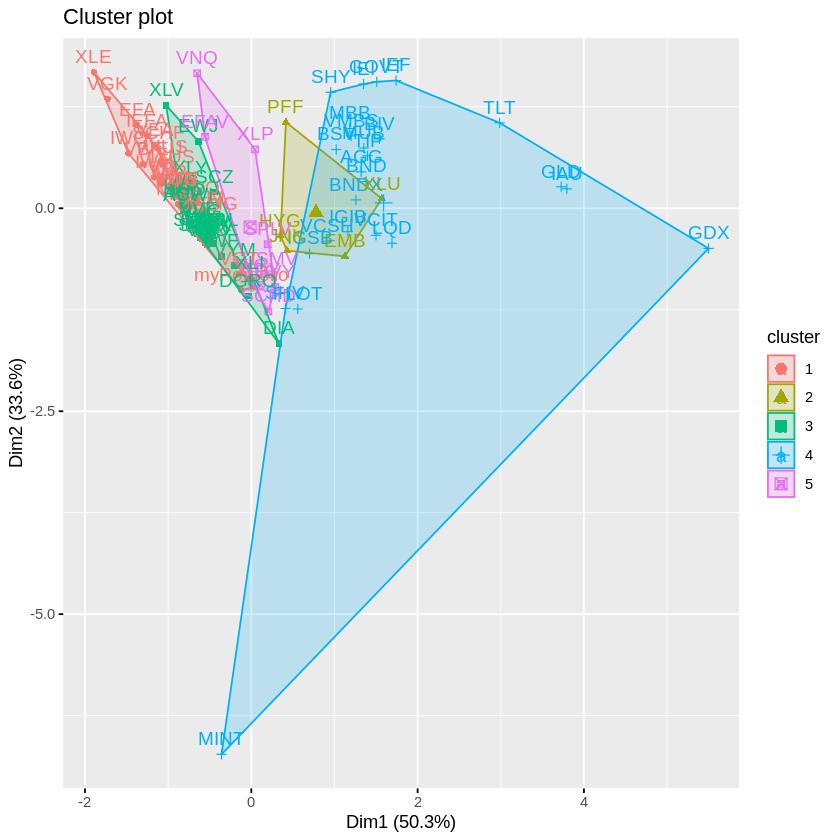

In [74]:
betas = CAPM.beta(Ra = all_returns, Rb = SPY_returns, Rf = 0)
alphas = CAPM.alpha(Ra = all_returns, Rb = SPY_returns, Rf = 0)
sharpe = colMeans(all_returns) / sqrt(diag(var(all_returns)))

beta_alphas_sharpe = cbind(t(betas), t(alphas), sharpe)
colnames(beta_alphas_sharpe) = c("beta", "alpha", "sharpe")
beta_alphas_sharpe = na.omit(beta_alphas_sharpe)

#build k-means model with k=5
kmeans_model = kmeans(beta_alphas_sharpe, centers = 5, iter.max = 10, nstart = 1)
fviz_cluster(kmeans_model, data = beta_alphas_sharpe)


The beta_alphas_sharpe data looks like:

In [75]:
beta_alphas_sharpe

,beta,alpha,sharpe
myPortfolio,1.13195462,2.448565e-04,0.11087240
SPY,0.99907554,7.990310e-05,0.09882326
IVV,0.99416062,7.538420e-05,0.09810719
VTI,1.02828252,7.181709e-05,0.09690680
VOO,0.99786121,8.478009e-05,0.09958568
QQQ,1.14724576,9.314040e-05,0.08709309
VEA,1.11005835,-7.906794e-05,0.06273333
IEFA,1.11615018,-1.013028e-04,0.05967405
AGG,-0.05342569,1.480149e-04,0.06348267
VWO,1.26237497,1.174207e-04,0.07751831


We can plot the 𝛽
, 𝛼
, and 𝑠ℎ𝑎𝑟𝑝𝑒
 values in a 3D plot and colour them according to the clusters from the kmeans model. It also gives me the opportunity to use the threejs package which we can interact with.



In [76]:
scatterplot3js(beta_alphas_sharpe, color = factor(kmeans_model$cluster), size = 0.5, bg = "white")


HTML widgets cannot be represented in plain text (need html)

#### **Factor Modelling Fama and French**

Finally, I analyse the performance of the various ETF’s. The CAPM formula tries to explain the performance of a portfolio through a sigle factor, the market as a whole. CAPM is defined as follows:

𝑅𝑎=𝑅𝑟𝑓+𝛽𝑎(𝑅𝑚−𝑅𝑟𝑓)

We can take the model further by adding Factors to the model. Thus, the 3 Factor model looks like:

𝑅𝑎=𝑅𝑟𝑓+𝛽𝑎(𝑅𝑚−𝑅𝑟𝑓)+𝛽𝑏(𝑆𝑀𝐵)+𝛽𝑐𝐻𝑀𝐿

Which takes the market factor from the CAPM and adds 2 new factors, the 𝑆𝑀𝐵
 and 𝐻𝑀𝐿
 or Small-minus-Big and High-minus-Low. The 𝑆𝑀𝐵
 tries to caputre the size effect, small market cap companies should outperform the market over the long run. The 𝐻𝑀𝐿
 aims to capture the value verses growth effect by sorting assests based on high book-to-market ratios (defined at the begining of the post). Firms which typically have a high book-to-market ratio are value stocks and low book-to-market ratios are growth stocks, the literature also shows that value stocks outperform growth stocks over the long term horizon.

The Fama French factor model allows us to analyse fund managers performance, since, if an asset managers portfolio can be explained by the Fama French factors then that fund manager has not added any value through portfolio selection and skill and subseuently obtained no alpha.

More formally, our equation becomes:

𝑋𝑇=𝑎𝑇+𝐵𝐹𝑇+𝐸𝑇

Where 𝐹
 is a matrix of factors and 𝐵
 is a scalar of 𝛽
’s such that 𝐵=[𝑏1,𝑏2,𝑏3]
, in which 𝑏1
 is the market 𝛽
, 𝑏2
 is the 𝑆𝑀𝐵
 𝛽
 and 𝑏3
 is the 𝐻𝑀𝐿
 𝛽
. More formally extending to include more factors up to 𝑁
 we have; 𝐵=[𝛽1,...,𝛽𝑁]𝑇

We want to fit a line which minimises the squared errors such that; 𝑚𝑖𝑛𝑖𝑚𝑖𝑠𝑒,𝛽
 |𝑋𝑇−𝑎𝑇−𝐵𝐹𝑇|2𝐹

The solution becomes [𝑎,𝐵]=𝑋𝑇𝐹˜(𝐹˜𝑇𝐹˜)−1
 which we can solve in R using the following:

(For completness I re-download the data)



I download the data as before randomly selecting from Wikipedia and convert the daily prices to daily returns - (I set a seed such that we collect the same data using set.seed).

In [77]:
'%+%' = paste0

start_date = "2016-01-01"
end_date = "2019-11-15"

set.seed(4746)
url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"

#obtain ETFs symbols
symbols = url %>%
  read_html() %>%
  html_nodes(xpath = '//*[@id="constituents"]') %>%
  html_table() %>%
  .[[1]] %>%
  filter(!str_detect(Security, "Class A|Class B|Class C")) %>%     # Removes firms with Class A shares
  sample_n(20) %>%
  pull(Symbol)

#calculate asset returns
asset_returns = tq_get(
  symbols,
  from = start_date,
  to = end_date
) %>%
  group_by(symbol) %>%
  tq_transmute(
    select = adjusted,
    mutate_fun = periodReturn,
    period = "daily",
    type = "arithmetic"
  ) %>%
  select(symbol, date, daily.returns) %>%
  pivot_wider(names_from = symbol, values_from = daily.returns) %>%
  .[-1, ]


In [78]:
asset_returns

date,MMM,OXY,MS,TXT,SYY,NDSN,PODD,LLY,XEL,⋯,HLT,TSLA,IR,IT,DAL,CTRA,ZTS,CVS,BIIB,CZR
<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2016-01-05,0.0043588066,0.016614798,-0.006353236,0.0024092918,0.0007383581,-0.0148381178,0.0116028141,0.014962881,0.0100838516,⋯,0.0004742664,8.951502e-05,NA,0.0103256972,-0.001849733,-0.001137242,0.0156545884,0.0029032120,0.0070599997,0.0472143525
2016-01-06,-0.0201408400,-0.045089764,-0.024936084,-0.0300478928,-0.0034711493,-0.0269188959,0.0013336686,-0.006301270,0.0105377669,⋯,-0.0521324957,-1.964820e-02,NA,-0.0070754408,0.007412208,-0.088218378,0.0002083673,-0.0121978415,-0.0101786970,0.0009017339
2016-01-07,-0.0243617668,-0.018031878,-0.049836270,-0.0205698587,-0.0099524775,-0.0263460749,-0.0210442434,-0.025963093,0.0038420033,⋯,-0.0374999720,-1.547661e-02,NA,-0.0244316658,-0.039444244,0.034956481,-0.0304040333,-0.0144410823,-0.0329269380,-0.0405406079
2016-01-08,-0.0034048749,-0.016962415,-0.020703762,-0.0113865151,0.0002511791,-0.0214782390,-0.0538775386,-0.001965267,-0.0109348674,⋯,-0.0051952794,-2.156275e-02,NA,-0.0062608802,-0.008297892,0.037394319,-0.0146049505,-0.0065833196,-0.0120418764,0.0009389887
2016-01-11,-0.0002134108,-0.030868967,0.002818969,-0.0046074202,0.0080403734,-0.0027649775,-0.0161058777,-0.012061525,0.0080154978,⋯,0.0047003022,-1.492891e-02,NA,0.0001166974,0.002789078,-0.069767434,-0.0283347638,0.0145362022,-0.0073059903,0.0000000000
2016-01-12,0.0028475900,-0.004083447,0.000000000,0.0048859545,0.0144566486,0.0022528802,0.0084770805,0.001619380,-0.0038386447,⋯,0.0166315522,1.019968e-02,NA,0.0108492801,0.004706947,-0.032500124,0.0087485818,0.0081120656,0.0004667368,-0.0112570251
2016-01-13,-0.0151923944,-0.009349055,-0.055165256,-0.0289152554,-0.0162165039,-0.0245548938,-0.0269565306,-0.013681370,-0.0060555516,⋯,-0.0521469876,-4.600658e-02,NA,-0.0296595459,-0.043015385,0.014212018,-0.0382478379,-0.0165114348,-0.0409804173,0.0000000000
2016-01-14,0.0177335704,0.059602673,0.009668973,0.0002635786,0.0022478875,-0.0028361964,0.0241287275,0.040857487,0.0166155527,⋯,-0.0075511754,2.930452e-02,NA,0.0158182897,0.008900704,0.038853472,0.0203468228,0.0148759153,0.0498410003,-0.0151802512
2016-01-15,-0.0176368671,-0.018906251,-0.043462096,-0.0160695827,-0.0067283065,-0.0129776380,-0.0133799559,-0.015750064,-0.0057204548,⋯,-0.0353261950,-5.771585e-03,NA,0.0073761530,-0.018526383,0.006131032,-0.0169950633,-0.0168568335,-0.0258046853,-0.0038535608


In [79]:
myETFs = c("SPY", "IVV", "VTI", "VOO", "QQQ", "VEA", "IEFA", "AGG", "VWO",
           "EFA","IEMG","VTV", "IJH", "IWF","BND", "IJR", "IWM", "VUG",
           "GLD", "IWD", "VIG", "VNQ", "USMV", "LQD", "VO", "VYM", "EEM",
           "VB", "VCSH", "XLF", "VCIT", "VEU", "XLK", "ITOT", "IVW", "BNDX",
           "VGT", "DIA", "BSV", "SHV", "IWB", "IWR", "TIP", "SCHF", "MBB", "SDY",
           "MDY", "SCHX", "IEF", "HYG", "DVY", "XLV", "SHY", "IXUS", "TLT", "IVE",
           "PFF", "IAU", "VXUS", "RSP", "SCHB", "VV", "GOVT", "EMB", "MUB", "QUAL",
           "XLY", "VBR", "EWJ", "XLP", "VGK", "SPLV", "MINT", "BIV", "IGSB", "EFAV",
           "VT", "GDX", "XLU", "IWS", "XLI", "SCHD", "IWP", "ACWI", "VMBS", "XLE", "JNK",
           "VOE", "FLOT", "IWV", "JPST", "SCZ", "IEI", "IWN", "DGRO", "VBK", "IGIB", "IWO")


etf_returns = tq_get(
  myETFs,
  from = start_date,
  to = end_date
) %>%
  group_by(symbol) %>%
  tq_transmute(
    select = adjusted,
    mutate_fun = periodReturn,
    period = "daily",
    type = "arithmetic"
  ) %>%
  select(symbol, date, daily.returns) %>%
  pivot_wider(names_from = symbol, values_from = daily.returns) %>%
  .[-1, ]


In [80]:
etf_returns

date,SPY,IVV,VTI,VOO,QQQ,VEA,IEFA,AGG,VWO,⋯,FLOT,IWV,JPST,SCZ,IEI,IWN,DGRO,VBK,IGIB,IWO
<date>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2016-01-05,1.691167e-03,0.0020791068,0.0022389094,0.0017905314,-1.735104e-03,-0.001105942,-0.0016799800,4.631042e-04,0.002202802,⋯,-0.0001982369,2.449870e-03,NA,-0.0026274064,4.068257e-04,0.0045489831,0.0035559428,0.0004197561,1.212947e-03,5.900976e-04
2016-01-06,-1.261420e-02,-0.0130915160,-0.0134021755,-0.0126735090,-9.605818e-03,-0.018267523,-0.0175733296,3.795285e-03,-0.017896358,⋯,0.0000000000,-1.348254e-02,NA,-0.0168186268,2.929045e-03,-0.0117074852,-0.0137797364,-0.0155961983,1.490746e-03,-1.783455e-02
2016-01-07,-2.399140e-02,-0.0239274960,-0.0245103520,-0.0243553067,-3.131338e-02,-0.018889208,-0.0190293132,-9.233023e-05,-0.032288950,⋯,0.0001982762,-2.391759e-02,NA,-0.0152515011,2.271260e-03,-0.0265978287,-0.0187624360,-0.0281091663,1.581538e-03,-2.806360e-02
2016-01-08,-1.097686e-02,-0.0110775035,-0.0114025731,-0.0106261836,-8.200725e-03,-0.012356062,-0.0128030026,2.213913e-03,-0.008919653,⋯,-0.0005947996,-1.146393e-02,NA,-0.0133944809,2.023325e-03,-0.0161882949,-0.0122050465,-0.0146363035,1.207944e-03,-1.729325e-02
2016-01-11,9.900735e-04,0.0010370246,-0.0006125779,0.0001135211,3.076667e-03,0.004363960,0.0035368171,-2.852775e-03,-0.004333555,⋯,0.0003967987,-7.966898e-04,NA,0.0016969056,-1.211350e-03,-0.0003504291,0.0028832069,-0.0082720055,-1.762907e-03,-8.405978e-03
2016-01-12,8.068327e-03,0.0077191209,0.0068431599,0.0082957741,1.159787e-02,0.004055817,0.0046995394,2.214916e-03,0.003682541,⋯,0.0001982762,7.265053e-03,NA,0.0000000000,1.860054e-03,-0.0026849118,0.0086239116,0.0052019123,1.579831e-03,8.873278e-03
2016-01-13,-2.494065e-02,-0.0243161723,-0.0257655917,-0.0244572147,-3.448933e-02,-0.015003197,-0.0163710328,2.301619e-03,-0.011340916,⋯,-0.0001982369,-2.621188e-02,NA,-0.0141889238,2.018143e-03,-0.0282101478,-0.0211723538,-0.0324767869,1.948951e-03,-3.714468e-02
2016-01-14,1.641704e-02,0.0158596305,0.0153058460,0.0162322850,2.129525e-02,0.011716822,0.0124825339,-3.668257e-04,0.012820678,⋯,-0.0007930162,1.589775e-02,NA,0.0049408253,-2.417227e-04,0.0110814809,0.0147671938,0.0118960623,-1.018651e-03,1.769843e-02
2016-01-15,-2.146639e-02,-0.0210580040,-0.0210234958,-0.0214303533,-3.103673e-02,-0.034742484,-0.0354206713,1.194342e-03,-0.041972218,⋯,0.0003966895,-2.107236e-02,NA,-0.0312098614,2.739840e-03,-0.0169167225,-0.0192255758,-0.0164952896,-1.857228e-04,-1.698984e-02


I take the average daily return of the randomly selected stocks and join the data with the ETFs and set the data as a time series object. I also download the daily Fama French 3 factors from Kenneth French’s website and clean the data up a little.


In [81]:
portfolio_and_etfs = asset_returns %>%
  mutate(myPortfolio = rowMeans(select(., -date), na.rm = TRUE)) %>%
  select(date, myPortfolio) %>%
  inner_join(etf_returns, by = c("date")) %>%
  tk_xts(date_var = date)

Warning message:
“Non-numeric columns being dropped: date”


In [82]:
portfolio_and_etfs

             myPortfolio           SPY           IVV           VTI
2016-01-05  7.003580e-03  0.0016911670  0.0020791068  0.0022389094
2016-01-06 -1.660452e-02 -0.0126141955 -0.0130915160 -0.0134021755
2016-01-07 -2.278163e-02 -0.0239913988 -0.0239274960 -0.0245103520
2016-01-08 -9.189368e-03 -0.0109768592 -0.0110775035 -0.0114025731
2016-01-11 -7.653880e-03  0.0009900735  0.0010370246 -0.0006125779
2016-01-12  2.568028e-03  0.0080683270  0.0077191209  0.0068431599
2016-01-13 -2.607393e-02 -0.0249406541 -0.0243161723 -0.0257655917
2016-01-14  1.729889e-02  0.0164170424  0.0158596305  0.0153058460
2016-01-15 -1.436550e-02 -0.0214663936 -0.0210580040 -0.0210234958
2016-01-19  2.262635e-05  0.0013313154  0.0005296094 -0.0010476557
       ...                                                        
2019-11-01  1.155379e-02  0.0092641930  0.0097712507  0.0107018661
2019-11-04  1.096698e-02  0.0040176337  0.0037667148  0.0036577523
2019-11-05 -9.613551e-03 -0.0011063993 -0.0011968954 -0.000895

In [83]:
# file name list = frenchdata::get_french_data_list()$files_list
North_America_3_Factors = download_french_data('Fama/French 3 Factors [Daily]')$subsets$data[[1]] %>%
  mutate(date = ymd(date)) %>%
  drop_na(date) %>%
  rename(Mkt_Rf_3 = `Mkt-RF`,
         SMB_3 = SMB,
         HML_3 = HML,
         RF_3 = RF) %>%
  select(-RF_3) %>%
  mutate_at(vars(c("Mkt_Rf_3", "SMB_3", "HML_3")), funs(./100))%>%
  tk_xts(date_var = date)
  North_America_3_Factors

New names:
• `` -> `...1`
Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”
Warning message:
“Non-numeric columns being dropped: date”


           Mkt_Rf_3   SMB_3   HML_3
1926-07-01   0.0010 -0.0025 -0.0027
1926-07-02   0.0045 -0.0033 -0.0006
1926-07-06   0.0017  0.0030 -0.0039
1926-07-07   0.0009 -0.0058  0.0002
1926-07-08   0.0021 -0.0038  0.0019
1926-07-09  -0.0071  0.0043  0.0057
1926-07-10   0.0062 -0.0053 -0.0010
1926-07-12   0.0004 -0.0003  0.0064
1926-07-13   0.0048 -0.0028 -0.0020
1926-07-14   0.0004  0.0007 -0.0043
       ...                         
2023-09-18  -0.0004 -0.0081 -0.0019
2023-09-19  -0.0027 -0.0012 -0.0001
2023-09-20  -0.0095 -0.0010  0.0027
2023-09-21  -0.0169  0.0019  0.0038
2023-09-22  -0.0025  0.0002 -0.0050
2023-09-25   0.0039 -0.0011  0.0035
2023-09-26  -0.0146  0.0039 -0.0050
2023-09-27   0.0013  0.0069  0.0012
2023-09-28   0.0065  0.0016  0.0003
2023-09-29  -0.0027 -0.0003  0.0030

Finally we can compute the solution [𝑎,𝐵]=𝑋𝑇𝐹˜(𝐹˜𝑇𝐹˜)−1

In [84]:
three_factors = North_America_3_Factors[min(index(portfolio_and_etfs)) %+% "/" %+% max(index(portfolio_and_etfs))]
portfolio_and_etfs_new = portfolio_and_etfs[min(index(three_factors)) %+% "/" %+% max(index(three_factors))]
FF_3Factors = cbind(alpha = 1, three_factors)
Gamma = t(solve(t(FF_3Factors) %*% FF_3Factors, t(FF_3Factors) %*% portfolio_and_etfs_new))
Gamma

,alpha,Mkt_Rf_3,SMB_3,HML_3
myPortfolio,1.711229e-04,0.97305129,0.146082269,0.019733663
SPY,3.987268e-05,0.97722776,-0.130837158,-0.009130152
IVV,3.711103e-05,0.97673591,-0.130023705,-0.011270385
VTI,4.370831e-05,0.97199216,-0.015508040,-0.002045352
VOO,4.352447e-05,0.97600560,-0.133664194,-0.010245310
QQQ,6.352112e-05,1.16600898,-0.139764716,-0.480857346
VEA,-1.021558e-04,0.84986391,-0.085100817,0.146022593
IEFA,-1.015498e-04,0.84580040,-0.095430277,0.147773273
AGG,1.600772e-04,-0.05291371,-0.019338397,-0.121365586
VWO,-5.972696e-05,0.98971519,-0.087740744,0.081392082


Instead, we can estimate these using linear regression models. For my random portfolio myPortfolio we can use the lm function to fit a linear model and then use the tidy function from the broom package to tidy the output up a little:

In [85]:
library(broom)
regdata = cbind(FF_3Factors, portfolio_and_etfs_new)

regdata$JPST <- NULL

myPortfolioReg = lm(myPortfolio ~ Mkt_Rf_3 + SMB_3 + HML_3, data = regdata, na.action = na.exclude)
tidy(myPortfolioReg)

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0.0001711229,0.0001098312,1.558054,1.195467e-01
Mkt_Rf_3,0.9730512896,0.0132700717,73.326755,0.000000e+00
SMB_3,0.1460822693,0.0220381259,6.628616,5.614547e-11
HML_3,0.0197336627,0.0193929758,1.017568,3.091373e-01


We can apply this to all our ETFs in the data using the apply command and applying our own custom lm function.



In [86]:
regressionLists = apply(regdata, 2, function(y)
  lm(y~Mkt_Rf_3 + SMB_3 + HML_3, data = regdata,na.action = na.exclude)
  )


We can also apply the tidy command to individual ETFs and then use the stars.pval to make the data even more tidy.

In [87]:
library(gtools)
tidy(regressionLists$myPortfolio) %>%
  mutate(p.value = stars.pval(p.value))

tidy(regressionLists$myPortfolio) %>%
  mutate(p.value = stars.pval(p.value))

tidy(regressionLists$VTV)%>%
  mutate(p.value = stars.pval(p.value))

tidy(regressionLists$LQD) %>%
  mutate(p.value = stars.pval(p.value))


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),0.0001711229,0.0001098312,1.558054,
Mkt_Rf_3,0.9730512896,0.0132700717,73.326755,***
SMB_3,0.1460822693,0.0220381259,6.628616,***
HML_3,0.0197336627,0.0193929758,1.017568,


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),0.0001711229,0.0001098312,1.558054,
Mkt_Rf_3,0.9730512896,0.0132700717,73.326755,***
SMB_3,0.1460822693,0.0220381259,6.628616,***
HML_3,0.0197336627,0.0193929758,1.017568,


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),5.066379e-05,4.470298e-05,1.133343,
Mkt_Rf_3,9.147728e-01,5.401123e-03,169.367157,***
SMB_3,-1.276163e-01,8.969855e-03,-14.227237,***
HML_3,2.610099e-01,7.893239e-03,33.067536,***


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),0.000233766,8.688158e-05,2.690627,**
Mkt_Rf_3,-0.011298776,1.049724e-02,-1.076357,
SMB_3,-0.035872070,1.743318e-02,-2.057689,*
HML_3,-0.164413639,1.534074e-02,-10.717448,***


Finally, we can apply this same method to all our ETFs using the lapply function to tidy the data and the map function to mutate or convert the p-value to stars. Then take a random sample of 5 ETFs regressions.

In [90]:
myTidyRegressions = lapply(regressionLists[4:length(regressionLists)],tidy)
myTidiedRegressions = map(myTidyRegressions, ~mutate(.,p.value = stars.pval(p.value)))

list.sample(myTidiedRegressions, 5)

Warning message in summary.lm(x):
“essentially perfect fit: summary may be unreliable”


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),-0.0002965363,0.0002661576,-1.114138,
Mkt_Rf_3,1.0909026641,0.0321578015,33.923422,***
SMB_3,0.0855116797,0.0534057158,1.601171,
HML_3,0.7185677076,0.0469956365,15.290094,***
term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<chr>
(Intercept),0.0001457881,5.012139e-05,2.90870,**
Mkt_Rf_3,0.8898777692,6.055788e-03,146.94666,***
SMB_3,-0.1387683570,1.005708e-02,-13.79807,***


A few notes here: We should be modelling the excess returns on the ETFs and not just the ETF returns. This is simple enough by replacing for example myPortfolio in the lm regressions with (𝑚𝑦𝑃𝑜𝑟𝑡𝑓𝑜𝑙𝑖𝑜−𝑅𝐹3)
 where 𝑅𝐹3
 is the risk free rate which comes with the Fama and French data. We should also probably use 𝑁𝑒𝑤𝑒𝑦𝑊𝑒𝑠𝑡
 adjusted standard errors by running

In [91]:
coeftest(myPortfolioReg, NeweyWest(myPortfolioReg, lag = N, prewhite = FALSE))


t test of coefficients:

              Estimate Std. Error t value  Pr(>|t|)    
(Intercept) 0.00017112 0.00004794  3.5695 0.0003752 ***
Mkt_Rf_3    0.97305129 0.01090241 89.2510 < 2.2e-16 ***
SMB_3       0.14608227 0.02200024  6.6400 5.214e-11 ***
HML_3       0.01973366 0.03977539  0.4961 0.6199169    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1


. Literature suggests that lags of 4(𝑁/100)2/9
 should be used, where 𝑁
 is the number of observations. We could rank the ETFs based on their alphas as before and go long on the high alphas and short on the low alphas. Run our hedge portfolio through a Fama French regression here and see if we are able to obtain better performances.

Finally, here I only used the 3 Factor model. There are more factors from the literature we could use. On the Kenneth French website we can collect data on 𝑀𝑎𝑟𝑘𝑒𝑡
, 𝑆𝑀𝐵
, 𝐻𝑀𝐿
, 𝑅𝑀𝑊
, 𝐶𝑀𝐴
 and 𝑀𝑂𝑀
. Where the 𝑅𝑀𝑊
 factor is a profitability factor, the 𝐶𝑀𝐴
 is an investment factor and the 𝑀𝑂𝑀
 is a momentum factor.



Below I pull in the daily Fama and French 5 Factor model and plot them.

In [92]:
#you can get famma french lists via frenchdata::get_french_data_list()$files_list
North_America_Factors = download_french_data('Fama/French 5 Factors (2x3) [Daily]')$subsets$data[[1]] %>%
  mutate(date = ymd(date)) %>%
  drop_na(date) %>%
  rename(Mkt_Rf_3 = `Mkt-RF`,
         SMB_3 = SMB,
         HML_3 = HML,
         RF_3 = RF) %>%
  select(-RF_3) %>%
  mutate_at(vars(c("Mkt_Rf_3", "SMB_3", "HML_3")), funs(./100))%>%
  tk_xts(date_var = date) %>%
  .[start_date %+% "/" %+% end_date]

New names:
• `` -> `...1`
Warning message:
“`funs()` was deprecated in dplyr 0.8.0.
ℹ Please use a list of either functions or lambdas:

# Simple named list: list(mean = mean, median = median)

# Auto named with `tibble::lst()`: tibble::lst(mean, median)

# Using lambdas list(~ mean(., trim = .2), ~ median(., na.rm = TRUE))”
Warning message:
“Non-numeric columns being dropped: date”


In [93]:
North_America_Factors

           Mkt_Rf_3   SMB_3   HML_3   RMW   CMA
2016-01-04  -0.0159 -0.0076  0.0052  0.35  0.42
2016-01-05   0.0012 -0.0024  0.0001  0.05  0.31
2016-01-06  -0.0135 -0.0023  0.0000  0.15  0.04
2016-01-07  -0.0244 -0.0029  0.0008  0.49  0.36
2016-01-08  -0.0111 -0.0052 -0.0003  0.25  0.05
2016-01-11  -0.0006 -0.0061  0.0040  0.65  0.34
2016-01-12   0.0072 -0.0048 -0.0077 -0.10 -0.39
2016-01-13  -0.0267 -0.0062  0.0081  0.40  0.63
2016-01-14   0.0165 -0.0005 -0.0040 -0.58 -0.43
2016-01-15  -0.0214  0.0040 -0.0024  0.37  0.45
       ...                                     
2017-12-15   0.0092  0.0068  0.0005  0.32 -0.47
2017-12-18   0.0067  0.0082  0.0027  0.22  0.16
2017-12-19  -0.0030 -0.0033 -0.0024  0.26  0.38
2017-12-20   0.0001  0.0037  0.0007 -0.16  0.35
2017-12-21   0.0024  0.0030  0.0062 -0.71  0.32
2017-12-22  -0.0007 -0.0020 -0.0021 -0.10  0.21
2017-12-26  -0.0007  0.0031 -0.0007 -0.13  0.58
2017-12-27   0.0005 -0.0016 -0.0020  0.09 -0.15
2017-12-28   0.0022  0.0010  0.0005 -0.1

In [94]:
ax = list(
  zeroline = TRUE,
  showline = TRUE,
  mirror = "ticks",
  gridcolor = toRGB('white'),
  gridwidth = 2,
  zerolinecolor = toRGB('white'),
  zerolinewidth = 4,
  linecolor = toRGB('white'),
  linewidth = 6,
  color = 'white'
)

North_America_Factors %>%
  `+`(1) %>%
  cumprod(.) %>%
  ROC(36, type = "discrete") %>%
  na.omit() %>%
  as.data.frame() %>%
  plot_ly(
    x = colnames(.),
    y = as.Date(index(.)),
    z = data.matrix(.),
    type = "surface",
    colors = c("darkblue", "yellow", "darkred"))  %>%
  plotly::layout(
    xaxis = ax, yaxis = ax,
    paper_bgcolor ='rgb(0,0,0)',
    #plot_bgcolor ='rgb(0,0,0)',
    title = "Fama French Factors",
    scene = list(
      xaxis = c(ax, title = "Factors", tickangle = -45),
      yaxis = c(ax, title = "Date", tickangle = -45),
      zaxis = c(ax, title = "Fama French Factor")
    ),
    titlefont = list(
      family = "Agency FB",
      size = 50,
      color = 'white')
  )


Warning message:
“The titlefont attribute is deprecated. Use title = list(font = ...) instead.”
Warning message:
“The titlefont attribute is deprecated. Use title = list(font = ...) instead.”


HTML widgets cannot be represented in plain text (need html)